# Deep Learning Lab: EE-045107
## Meeting 4: Denoising Diffusion Probabilistic Models
## Part II: Pretrained Models and Text-to-Image
### [Elias Nehme](https://eliasnehme.github.io/), <span style="color:red">Mar 03, 2024</span>

###  Submission Guidelines

* Submission on the course website (Moodle).
* Working environment:
    * You can work in `Jupyter Notebook` online using <a href="https://colab.research.google.com/">Google Colab</a> as it does not require any installation.
    * You can also work locally after installing the environment from the `requirements.txt` file using `pip`.
* You should submit two **separated** files:
    * A `.ipynb` file, with the name: `ee045107_meeting4_id1_id2_part2.ipynb` which contains your code implementations.
    * A `.pdf` file, with the name: `ee045107_meeting4_id1_id2_part1.pdf` which is your report containing **all the plots, answers, and discussions**.
      * if you see a <img src="assets/code_task_icon.png" style="height:30px;display:inline\">, complete the code and copy the relevant figures to the report.
      * if you see a <img src="assets/write_task_icon.png" style="height:30px;display:inline\"> icon, it means you need to answer the question in the report.
    * **No handwritten submissions** and no other file-types (`.docx`, `.html`, ...) will be accepted.

### Mounting your drive for saving/loading stuff

In [1]:
# relevant only if you work in google Colab
# from google.colab import drive
# drive.mount('/content/drive')

### Importing relevant libraries

In [2]:
## Standard libraries
import gc
import numpy as np
from PIL import Image
from typing import Tuple, Union

## Progress bar
from tqdm.auto import tqdm

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline

## Pytorch
import torch

## Diffusers and transformers
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import DDPMPipeline, UNet2DModel, AutoencoderKL, UNet2DConditionModel
from diffusers.schedulers import DDPMScheduler, UniPCMultistepScheduler
from diffusers.schedulers.scheduling_ddpm import DDPMSchedulerOutput
from diffusers.utils.torch_utils import randn_tensor

# device to be used (preferably a GPU, change Colab runtime type if needed)
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print("Using device", device)

Using device cuda:0


/home/dl_exp/Desktop/Deep Learning experiment/LabEnv/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/home/dl_exp/Desktop/Deep Learning experiment/LabEnv/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


## Introduction

In part I, we trained our own diffusion model on a two dimensional toy example. However, scaling from the 2D case to images requires a number of modifications to the architecture which results in a (very) long training time. Here, we will breifly cover the modifications underlying the adaptation of diffusion models to images. However, we will not train our own model. Instead, we will use a pre-trained model (by Google) on face images of celebrities, and explore its effectiveness in sampling, and solving inverse problems (such as image inpainting) in a *zero-shot* manner without task-specific training. Afterwards, we will also use a pre-trained Text-to-image model (by Stability AI) to generate images satisfying a desired given text prompt. But first, let us cover the main changes in the architecture from the 2D case to images.

### Architecture

In part I, we use a small *multilayer perceptron* (MLP) to process $\mathbf{x}_t$. For high resolution images, this choice is not feasible and results in rather poor performance in practice as the predicted noise is a tensor that has the same size/resolution as the input image. However, as you have seen in previous lab meetings, this is where *Convolutional Neural Networks* come in handy. Specifically, the architecture typically used for image-to-image tasks is very similar to that of an [Autoencoder](https://en.wikipedia.org/wiki/Autoencoder), which you may remember from typical "intro to deep learning" tutorials. Autoencoders have a so-called "bottleneck" layer in between the encoder and decoder. The encoder first encodes an image into a smaller hidden representation called the "bottleneck", and the decoder then decodes that hidden representation back into an actual image. This forces the network to only keep the most important information in the bottleneck layer.

 In DDPM, the authors used the **U-Net** architecture, introduced by ([Ronneberger et al., 2015](https://arxiv.org/abs/1505.04597)) (which, at the time, achieved state-of-the-art results for medical image segmentation). This network, like any autoencoder, consists of a bottleneck in the middle that makes sure the network learns only the most important information. Importantly, it introduced residual connections between the encoder and decoder, greatly improving gradient flow (inspired by ResNet in [He et al., 2015](https://arxiv.org/abs/1512.03385)).

<center width="100%"><img src="assets/unet_arch.jpeg" width="800px"></center>

As can be seen, a U-Net model first downsamples the input (i.e. makes the input smaller in terms of spatial resolution), after which upsampling is performed.

**Conditioning on $t$**: The parameters of the neural network are shared across time (noise level), $t$ is encoded using sinusoidal position embeddings inspired by the Transformer ([Vaswani et al., 2017](https://arxiv.org/abs/1706.03762)). This makes the neural network "know" at which particular time step (noise level) it is operating, for every image in a batch.

## Section I: Celebrity Faces

In this part we will experiment with the original checkpoint of DDPM released by Google. For this purpose, we will use [HuggingFace](https://huggingface.co/)'s diffusers library.

## Diffusers library <img src="assets/diffusers_logo.png" width="150px">

A very useful library for working with pre-trained diffusion models is the [diffusers](https://huggingface.co/docs/diffusers/en/index) 🤗 package. Diffusers is the go-to library for state-of-the-art pretrained diffusion models for generating images, audio, and even 3D structures of molecules. The library has three main components:
* State-of-the-art diffusion pipelines for inference with just a few lines of code.
* Interchangeable noise schedulers for balancing trade-offs between generation speed and quality.
* Pretrained models that can be used as building blocks, and combined with schedulers, for creating your own end-to-end diffusion systems.

Here, we will use the following checkpoint:

In [3]:
# original DDPM model from NeurIPS 2020
checkpoint = "google/ddpm-celebahq-256"
ddpm = DDPMPipeline.from_pretrained(checkpoint).to(device)

diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

To sample from this model we can simply use the property `images`given an appropriate number of inference steps (i.e. the amount of denoising steps to perform):

  0%|          | 0/50 [00:00<?, ?it/s]

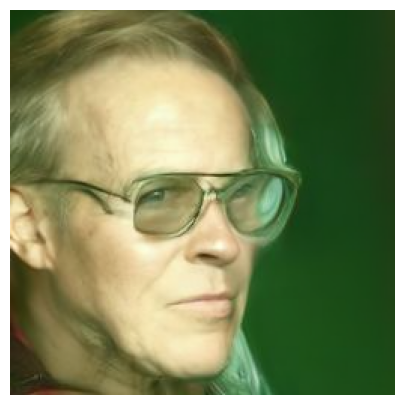

In [4]:
# generate a single sample and show the result
image = ddpm(num_inference_steps=50).images[0]
plt.figure(figsize=(5,5))
plt.imshow(image)
plt.axis("off")
plt.show()

<img src="assets/code_task_icon.png" style="height:30px;display:inline\"/> **<span style="color:red">Task 1</span>**. To get acquainted with this model, draw $N = 10$ samples and display them in different subplots.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

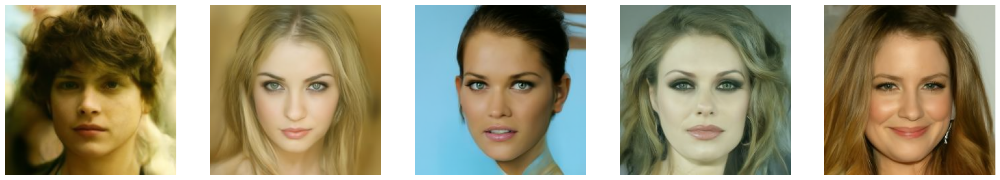

In [5]:
# TODO: draw and display samples.
fig, axs = plt.subplots(nrows=1, ncols=5, sharex=True, sharey=True, figsize=(5*5,5))
axs = axs.flatten()
for i in range(5):
    axs[i].imshow(ddpm(num_inference_steps=50).images[0])
    axs[i].axis("off")

While pipelines enable simple oneliners to run "complex" tasks such as sampling from a pre-trained model, they are somewhat limited in the functionality they expose to the user. For our purposes, here we will break down the pipeline to its constituting components: a `scheduler` and a `model`. The above pipeline can be equivalently written down as:   

In [6]:
# scheduler and model separately loaded
scheduler = DDPMScheduler.from_pretrained(checkpoint)
model = UNet2DModel.from_pretrained(checkpoint).to(device)

# number of steps in scheduler
scheduler.set_timesteps(50)

# image size
sample_size = model.config.sample_size

Similarly, to sample from the model we now need to run a denoising loop implementing Algorithm 2 from part I. This can be done using the following piece of code:

In [7]:
# starting noise
noise = torch.randn((1, 3, sample_size, sample_size), device=device)

# denoising loop for sampling
input = noise
for t in scheduler.timesteps:
    with torch.no_grad():
        noisy_residual = model(input, t).sample
    previous_noisy_sample = scheduler.step(noisy_residual, t, input).prev_sample
    input = previous_noisy_sample

Note that we used the scheduler `step` method to get from $\mathbf{x}_t$ (given by `input` in the above code) to $\mathbf{x}_{t-1}$ (given by `previous_noisy_sample`). At each denoising step, the neural network $\epsilon_{\theta}(\mathbf{x}_t,t)$ (given by `model`) predicts the noise (given by `noisy_residual`), and the predicted noise in addition to the timestep `t` and the current sample $\mathbf{x}_t$ (`input`) are fed to the scheduler `step` method which calculates both the prediction of the sample at the previous timestep $\mathbf{x}_{t-1}$ (`step().prev_sample`) and the prediction of $\mathbf{x}_0$ at time $t$, that is $\hat{\mathbf{x}}_0^t$ ( `step().pred_original_sample`- not used above).

To convert the resulting sample to an RGB image attached below for your convinience the function `convert_tensor_to_pil_img` which accepts a 3D tensor `x` and returns a PIL image `image`:

In [8]:
def convert_tensor_to_pil_img(tensor):
    """
    function converts a tensor of size CxHxW in [-1,1] to a PIL image in [0,255]
    :param x (torch.Tensor): input tensor.
    :return image (PIL.Image): output image.
    """
    image = (tensor / 2 + 0.5).clamp(0, 1).squeeze()
    image = (image.permute(1, 2, 0) * 255).round().to(torch.uint8).cpu().numpy()
    image = Image.fromarray(image)
    return image

Here is for example the application of this function to the output from the previous piece of code:

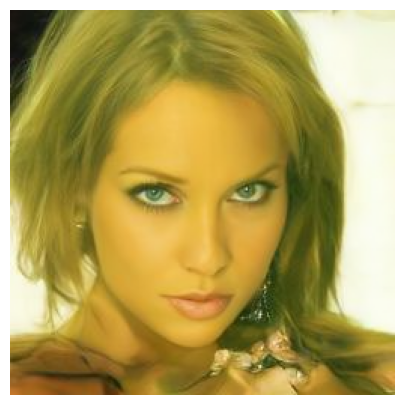

In [9]:
image = convert_tensor_to_pil_img(input)
plt.figure(figsize=(5,5))
plt.imshow(image)
plt.axis("off")
plt.show()

<img src="assets/code_task_icon.png" style="height:30px;display:inline\"/>**<span style="color:red">Task 2</span>**. To better understand the scheduler `step` method above, draw a sample and show the intermediate outputs $\mathbf{x}_{t-1}$ for different timesteps $t$. 

<img src="assets/write_task_icon.png" style="height:30px;display:inline\"/> Display the results in different subplots and explain what you observe throughout the generation process. Is it analogous to what you saw in the 2D spiral?

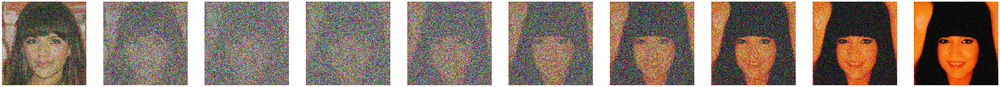

In [17]:
# TODO: show intermidiate predictions.
xt_all = []


for t in scheduler.timesteps:
    with torch.no_grad():
        noisy_residual = model(input, t).sample
    previous_noisy_sample = scheduler.step(noisy_residual, t, input).prev_sample
    input = previous_noisy_sample
    xt_all.append(input)



# plot intermediate results every 5 t steps
fig, axs = plt.subplots(nrows=1, ncols=10, sharex=True, sharey=True, figsize=(7*10,7))
axs = axs.flatten()
for t in range(0,50,5):
    axs[t//5].imshow(convert_tensor_to_pil_img(xt_all[t]))
    axs[t//5].axis("off")

To convert an RGB image to a tensor attached below for your convinience the function `convert_pil_image_tensor` which accepts a PIL image `image` and returns a 3D tensor `x`:

In [18]:
def convert_pil_image_to_tensor(image):
    """
    function converts a PIL image in [0,255] to a tensor of size CxHxW in [-1,1] 
    :param image (PIL.Image): input image.
    :return image (torch.Tensor): output tensor.
    """
    tensor = torch.from_numpy(np.array(image)).permute(2,0,1)
    tensor = tensor/255.*2. - 1.
    return tensor

## Zero shot image inpainting

Besides sampling images from pure noise (which is cool in of itself!), diffusion models enable solving inverse problems in a [*Zero-Shot*](https://en.wikipedia.org/wiki/Zero-shot_learning) manner. That is, at test time, we use our generative model to solve a problem that it was not trained to solve directly. Note that this is unlike *Supervised learning* where we learn to solve a certain problem by observing matched inputs and outputs during training. As an example for such a scenario, here we will tackle the task of image inpainting. The problem of image inpainting entails filling "holes" in a given image within a user specified mask. For example, consider the following mask:

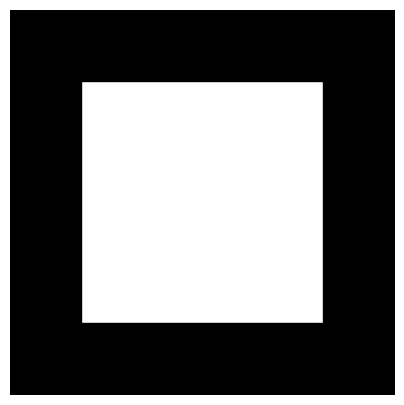

In [19]:
# example inpainting mask tensor
half_width = 80
im_center = sample_size // 2
mask_tensor = torch.zeros((3,sample_size,sample_size))
mask_tensor[:,im_center-half_width:im_center+half_width,im_center-half_width:im_center+half_width] = 1.

# show it in black and white
plt.figure(figsize=(5,5))
plt.imshow(mask_tensor.sum(axis=0), cmap="gray")
plt.axis("off")
plt.show()

The corresponding inpainting task given some ground truth image $\mathbf{x}_0$, would be to recover $\mathbf{x}_0$ from an image $\mathbf{y}$ which have the white pixels missing:

Text(0.5, 1.0, 'Desired output')

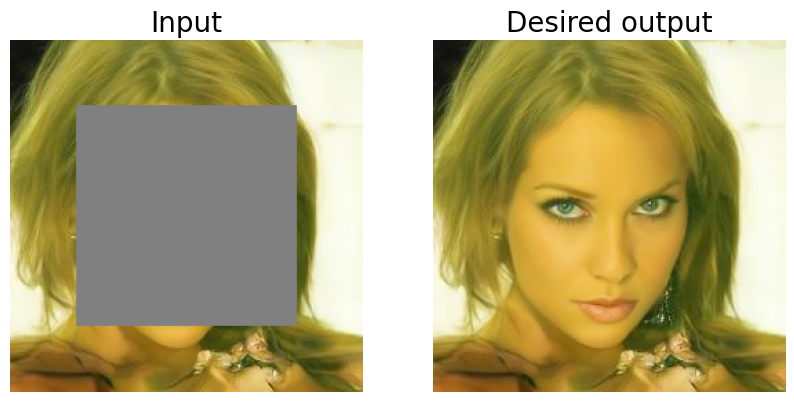

In [13]:
# take x0 as the last generated sample for the example
x0 = convert_pil_image_to_tensor(image)

# generate y by simple masking
y = x0*(1. - mask_tensor)

# show the resulting task input and output
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(convert_tensor_to_pil_img(y))
plt.axis("off")
plt.title("Input", fontsize=20)
plt.subplot(1,2,2)
plt.imshow(convert_tensor_to_pil_img(x0))
plt.axis("off")
plt.title("Desired output", fontsize=20)

Note that this task is severely ill-posed with an infinite number of solutions satisfying the input measurement/image. Here, we will solve it *stochastically* by sampling output images that are consistent with the input $\mathbf{y}$. Equipped with our generative model, the approach we take is simple: 
* At each timestep throughout the denoising process, we swap the generated pixels outside the mask in the predcited $\hat{\mathbf{x}}_0^t$ with the pixels from $\mathbf{y}$. Since this process is iteratively repeated throughout the denoising process, the result is expected to be smooth and "good-looking". Mathematically, this ensures that our final sample $\mathbf{x}_0$ will be *consistent*  with $\mathbf{y}$, hence sampling from the posterior distribuion $p(\mathbf{x}_0|\mathbf{y})$. For those of you interested in the underlying math you can read more about it in the papers [RePaint](https://openaccess.thecvf.com//content/CVPR2022/papers/Lugmayr_RePaint_Inpainting_Using_Denoising_Diffusion_Probabilistic_Models_CVPR_2022_paper.pdf) and [DDNM](https://arxiv.org/pdf/2212.00490.pdf).

To implement this strategy, here we will reimplement the `step` method in the `DDPMScheduler` by altering the predicted $\hat{\mathbf{x}}_0^t$ internally to take the mask and the input image $\mathbf{y}$ input account like so:

In [20]:
# class of manipulated sampler for the inpainting task
class InpaintingScheduler(DDPMScheduler):
    def __init__(self, *args, **kwargs):
        super(InpaintingScheduler, self).__init__(*args, **kwargs)
    
    def step(
        self,
        model_output: torch.FloatTensor,
        timestep: int,
        sample: torch.FloatTensor,
        y: torch.FloatTensor,
        mask: torch.FloatTensor,
        generator=None,
        return_dict: bool = True,
    ) -> Union[DDPMSchedulerOutput, Tuple]:
        """
        Predict the sample from the previous timestep by reversing the SDE. This function propagates the diffusion
        process from the learned model outputs (most often the predicted noise).

        Args:
            model_output (`torch.FloatTensor`): The direct output from learned diffusion model.
            timestep (`float`): The current discrete timestep in the diffusion chain.
            sample (`torch.FloatTensor`): A current instance of a sample created by the diffusion process.
            y (`torch.FloatTensor`): The input measured image y that we need to conform to otuside the mask.
            mask (`torch.FloatTensor`): The inpainting mask.
            generator (`torch.Generator`, *optional*): A random number generator.
            return_dict (`bool`, *optional*, defaults to `True`): Whether or not to return a [`~schedulers.scheduling_ddpm.DDPMSchedulerOutput`] or `tuple`.

        Returns:
            [`~schedulers.scheduling_ddpm.DDPMSchedulerOutput`] or `tuple`:
                If return_dict is `True`, [`~schedulers.scheduling_ddpm.DDPMSchedulerOutput`] is returned, otherwise a
                tuple is returned where the first element is the sample tensor.
        """
        t = timestep

        prev_t = self.previous_timestep(t)

        if model_output.shape[1] == sample.shape[1] * 2 and self.variance_type in ["learned", "learned_range"]:
            model_output, predicted_variance = torch.split(model_output, sample.shape[1], dim=1)
        else:
            predicted_variance = None

        # 1. compute alphas, betas
        alpha_prod_t = self.alphas_cumprod[t]
        alpha_prod_t_prev = self.alphas_cumprod[prev_t] if prev_t >= 0 else self.one
        beta_prod_t = 1 - alpha_prod_t
        beta_prod_t_prev = 1 - alpha_prod_t_prev
        current_alpha_t = alpha_prod_t / alpha_prod_t_prev
        current_beta_t = 1 - current_alpha_t

        # 2. compute predicted original sample from predicted noise also called
        # "predicted x_0" of formula (15) from https://arxiv.org/pdf/2006.11239.pdf
        if self.config.prediction_type == "epsilon":
            pred_original_sample = (sample - beta_prod_t ** (0.5) * model_output) / alpha_prod_t ** (0.5)
        elif self.config.prediction_type == "sample":
            pred_original_sample = model_output
        elif self.config.prediction_type == "v_prediction":
            pred_original_sample = (alpha_prod_t**0.5) * sample - (beta_prod_t**0.5) * model_output
        else:
            raise ValueError(
                f"prediction_type given as {self.config.prediction_type} must be one of `epsilon`, `sample` or"
                " `v_prediction`  for the DDPMScheduler."
            )
        
        # 2.5. inpainting specific code to manipulate predicted x_0^t to be consistent with y
        # ============================================================================================================
        device = model_output.device
        mask = mask.to(device)
        inv_mask = torch.ones_like(mask) - mask
        y = y.to(device)
        pred_original_sample = pred_original_sample*mask + inv_mask*y
        # ============================================================================================================
        
        # 3. Clip or threshold "predicted x_0"
        if self.config.thresholding:
            pred_original_sample = self._threshold_sample(pred_original_sample)
        elif self.config.clip_sample:
            pred_original_sample = pred_original_sample.clamp(
                -self.config.clip_sample_range, self.config.clip_sample_range
            )
        
        # 4. Compute coefficients for pred_original_sample x_0 and current sample x_t
        # See formula (7) from https://arxiv.org/pdf/2006.11239.pdf
        pred_original_sample_coeff = (alpha_prod_t_prev ** (0.5) * current_beta_t) / beta_prod_t
        current_sample_coeff = current_alpha_t ** (0.5) * beta_prod_t_prev / beta_prod_t

        # 5. Compute predicted previous sample µ_t
        # See formula (7) from https://arxiv.org/pdf/2006.11239.pdf
        pred_prev_sample = pred_original_sample_coeff * pred_original_sample + current_sample_coeff * sample

        # 6. Add noise
        variance = 0
        if t > 0:
            device = model_output.device
            variance_noise = randn_tensor(
                model_output.shape, generator=generator, device=device, dtype=model_output.dtype
            )
            if self.variance_type == "fixed_small_log":
                variance = self._get_variance(t, predicted_variance=predicted_variance) * variance_noise
            elif self.variance_type == "learned_range":
                variance = self._get_variance(t, predicted_variance=predicted_variance)
                variance = torch.exp(0.5 * variance) * variance_noise
            else:
                variance = (self._get_variance(t, predicted_variance=predicted_variance) ** 0.5) * variance_noise

        pred_prev_sample = pred_prev_sample + variance

        if not return_dict:
            return (pred_prev_sample,)

        return DDPMSchedulerOutput(prev_sample=pred_prev_sample, pred_original_sample=pred_original_sample)

<img src="assets/code_task_icon.png" style="height:30px;display:inline\">**<span style="color:red">Task 3</span>**. Use the above scheduler to perform the task of image inpainting for a specific sample $\mathbf{x}_0$ produced by the model, and the mask `mask_tensor` provided above.Specifically, 
1. First produce a sample $\mathbf{x}_0$ using the standard scheduler.
2. Once you are satisfied with the result, apply the mask `mask_tensor` to the sample $\mathbf{x}_0$ to produce $\mathbf{y}$ as done in the example above.
3.  Afterwards, apply denoising with the new scheduler `InpaintingScheduler` to sample $N=5$ different possible outputs from $p(\mathbf{x}_0|y)$. Show the resulting images and compare thm with the ground truth sample $\mathbf{x}_0$ that produced $\mathbf{y}$. 

**Remark**: To initialize the `InpaintingScheduler` you can use the same code as for the `DDPMScheduler`, i.e. `inpainting_scheduler = InpaintingScheduler.from_pretrained(checkpoint)`.

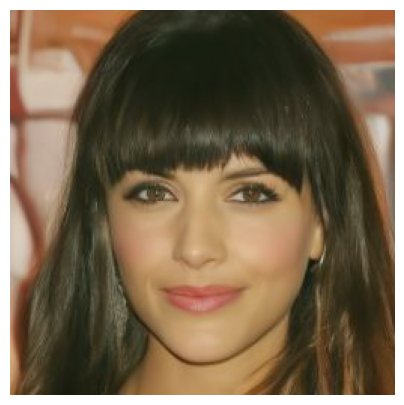

In [21]:
# =====================================================================
# step 1: generate an image we like => this will be x0
# =====================================================================

# starting noise
g = torch.Generator(device).manual_seed(30)
noise = torch.randn((1, 3, sample_size, sample_size), device=device, generator=g)

# denoising loop for sampling
input = noise
for t in scheduler.timesteps:
    with torch.no_grad():
        noisy_residual = model(input, t).sample
    previous_noisy_sample = scheduler.step(noisy_residual, t, input, generator=g).prev_sample
    input = previous_noisy_sample

# show result
image = convert_tensor_to_pil_img(input)
plt.figure(figsize=(5,5))
plt.imshow(image)
plt.axis("off")
plt.show()

In [16]:
# TODO: Implement the necessary code, you may add additional code cells if you would like.
# =====================================================================
# step 2: apply the mask to x0 to produce y
# =====================================================================

# take x0 as the last generated sample for the example
x0 = convert_pil_image_to_tensor(image)
y = ???

# show the resulting task input and output
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(convert_tensor_to_pil_img(y))
plt.axis("off")
plt.title("Input", fontsize=20)
plt.subplot(1,2,2)
plt.imshow(convert_tensor_to_pil_img(x0))
plt.axis("off")
plt.title("Desired output", fontsize=20)

SyntaxError: invalid syntax (3801652427.py, line 8)

In [ ]:
# TODO: Implement the necessary code, you may add additional code cells if you would like.
# =====================================================================
# step 3: sampling consistent outputs from p(x0|y) using new scheduler
# =====================================================================

inp_scheduler = InpaintingScheduler.from_pretrained(checkpoint)
inp_scheduler.set_timesteps(???)

# starting noise: different seeds ==> different images
g = torch.Generator(device='cuda').manual_seed(0)

???

# show result
image_new = convert_tensor_to_pil_img(???)
plt.figure(figsize=(5,5))
plt.imshow(image_new)
plt.title("Sample from $p(x_0|y)$", fontsize=20)
plt.axis("off")
plt.show()

## Section II: Text-to-image models

Perhaps one of the most exciting recent advances in image generation is text-to-image generation such as [DALLE](https://openai.com/dall-e-2) and [Imagen](https://imagen.research.google/). The idea follows the same rationale from the previous section. In image inpainting, we "conditioned" the generation process to a given input image with missing pixels ($\mathbf{y}$). More generally, we can condition the generation on other forms of information, such as a *text prompt*. To achieve this, we need to be able to first convert the text into a useful form that can be incorporated into the diffusion model. As you saw in Meeting 3, this entails [Tokenization](https://neptune.ai/blog/tokenization-in-nlp) and then [Embedding](https://en.wikipedia.org/wiki/Word_embedding) the text prompt to an appropriate vector space. Here, we will work with the publicly available Text-to-image model [StableDiffusion](https://stability.ai/news/stable-diffusion-public-release) conviniently provided by the diffusers package. Specifically, after Tokenization, the text is encoded into a useful representation using [CLIP](https://arxiv.org/abs/2103.00020), a powerful image-text model which was trained using contrastive learning on a large dataset of image-text pairs:

<center width="100%"><img src="assets/clip_encoders.png" width="800px"></center>

StableDiffusion uses CLIP to condition the generation process on text! The way this is achieved is using a technique called [Classifier-free Guidance](https://arxiv.org/abs/2207.12598), where the neural network $\epsilon_{\theta}(\mathbf{x}_t,t)$ have an additional conditioning input $c$, $\epsilon_{\theta}(\mathbf{x}_t,t,c)$, such that it is trained to both estimate the noise with and without $c$ (e.g. with an empty text prompt $c=$`""`). The resulting noise estimates can then be combined to take into account the conditioning information via the formula:
$$\hat{\epsilon}_t = \epsilon_{\theta}(\mathbf{x}_t,t,\varnothing) + \eta (\epsilon_{\theta}(\mathbf{x}_t,t,c) - \epsilon_{\theta}(\mathbf{x}_t,t,\varnothing)),$$
Where $\eta$ is called the guidance scale/strength. The intuition behind this formula is the following: The noise estimate at timestep $t$ is the standard unconditional noise estimate as before $\epsilon_{\theta}(\mathbf{x}_t,t,\varnothing)$ + an additional step of strength $\eta$ in the direction $\mathbf{v}_t = \epsilon_{\theta}(\mathbf{x}_t,t,c) - \epsilon_{\theta}(\mathbf{x}_t,t,\varnothing)$ of the noise estimate under the conditioning information. This mechanism allows us to add user control over the generated image result with general forms of input other than images (such as text).

Below is a schematic depicting the high-level architecture of StableDiffusion:

<center width="100%"><img src="assets/stablediff.png" width="800px"></center>

Notice that the architecture applies the diffusion process in the *latent space* of a [Variational Autoencoder](https://en.wikipedia.org/wiki/Variational_autoencoder) (VAE) instead of directly in pixel space to save computations. The input image $x$ (if there is any) is first encoded using an image encoder $\mathcal{E}$ to the latent space resulting in latent $z$. This latent undergoes the addition of noise according to the diffusion process variance schedule to result in a final noise $z_T$. Next, the tokenized text prompt is encoded with CLIP text encoder (e.g. $\tau_{\theta}$ in the image above) and the resulting features are infused into the denoising process $z\leftarrow z_T$ through concatenation/more generally cross-attention. To recover the final generated image in pixel space $\tilde{x}$, the resulting sample in latent space $z$ is decoded with the image decoder $\mathcal{D}$. 

Below provided is the code loading StableDiffusion:

In [ ]:
# delete the DDPM model to free GPU memory
# del model
gc.collect()
torch.cuda.empty_cache()

# general settings of Stable Diffusion
height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 25  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
generator = torch.Generator(device).manual_seed(20)  # Seed generator to create the initial latent noise
checkpoint_stable = "CompVis/stable-diffusion-v1-4"

# image encoder and decoder (VAE)
vae = AutoencoderKL.from_pretrained(checkpoint_stable, subfolder="vae", use_safetensors=True)

# CLIP tokenizer and text encoder
tokenizer = CLIPTokenizer.from_pretrained(checkpoint_stable, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(checkpoint_stable, subfolder="text_encoder", use_safetensors=True)

# denoising U-Net model
unet = UNet2DConditionModel.from_pretrained(checkpoint_stable, subfolder="unet", use_safetensors=True)

# scheduler
scheduler = UniPCMultistepScheduler.from_pretrained(checkpoint_stable, subfolder="scheduler")
scheduler.set_timesteps(num_inference_steps)

# move everything to the GPU
vae.to(device)
text_encoder.to(device)
unet.to(device)
print("Loaded all components!")

Loaded all components!


Next, we are left with the fun part! To generate an image from a text prompt we need to do multiple steps as detailed below. 

On the text front:
* We first need to choose a desired text prompt given in `prompt`. Below we choose `prompt=["a photograph of an astronaut riding a horse"]`.
* We next have to tokenize and encode it using the CLIP tokenizer `tokenizer` and text encoder `text_encoder` respectively.
* To perform classifier-free guidance, we need to feed in also an empty text prompt `""`. In the code below we achieve this efficiently via batching the conditional and unconditional text embeddings into a final variable `text_embeddings`.

In [ ]:
# desired text prompt
prompt = ["a photograph of an elephant in collor skin of a zebra"]
batch_size = len(prompt)

# tokenization
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

# encoding with CLIP
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(device))[0]

# final text embeddings including unconditional for classifier guidance
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

Next, in the latent space we have to do the reverse diffusion conditioned on the text embeddings. This means we have to do the following:
* Initialize a noise vector in latent space $z_T$ (given by `latents`) that conforms with the expected noise level and latent space dimensions. 
* Denoise the latent iteratively with the U-Net model `unet` to result in $z$ (given by the last `latents`). The model at each step predicts the noise with our desired text prompt `noise_pred_text` and with an empty prompt `noise_pred_uncond`. 
* The two resulting noise predictions are combined using the preset guidance parameter `guidance_scale` such that our generated result conforms to the desired prompt.
* Lastly, we use the scheduler `step` method to predict the previous timestep, i.e. to go from $\mathbf{x}_t$ to $\mathbf{x}_{t-1}$.  

In [ ]:
# initial noise in latent space
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=generator,
    device=device,
)
latents = latents * scheduler.init_noise_sigma

# denoising in latent space
for t in tqdm(scheduler.timesteps):

    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)

    # scale model input at timestep t
    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform classifier free guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample

  0%|          | 0/25 [00:00<?, ?it/s]

Finally, after reversing the diffusion process in the latent space, we need to go back to pixel space to get an image. This is achieved using the VAE image decoder as follows:

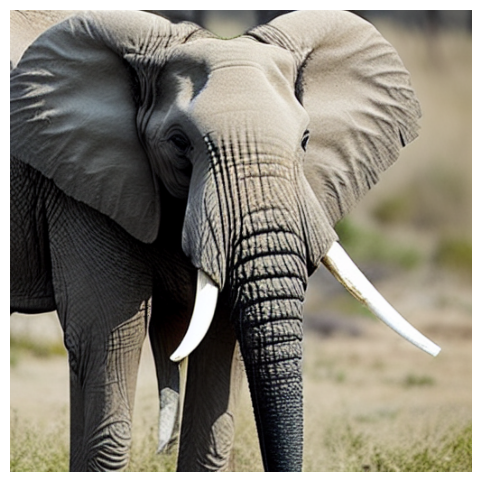

In [ ]:
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
with torch.no_grad():
    image = vae.decode(latents).sample

# convert to image and show result
image = convert_tensor_to_pil_img(image)
plt.figure(figsize=(6,6))
plt.imshow(image)
plt.axis("off")
plt.show()

Voila! we have our astronaut riding a horse somewhere in space!

<img src="assets/code_task_icon.png" style="height:30px;display:inline\"/> **<span style="color:red">Task 4</span>**. Choose a different prompt, and rerun the code above. Be creative! you can write almost anything that comes to mind, but try to keep the sentence short (i.e. roughly the same length). If the image does not look as great, you can run again after changing the initial random seed above in `generator = torch.Generator(device).manual_seed(3)` from 3 to whatever number. 

Loaded all components!


  0%|          | 0/25 [00:00<?, ?it/s]

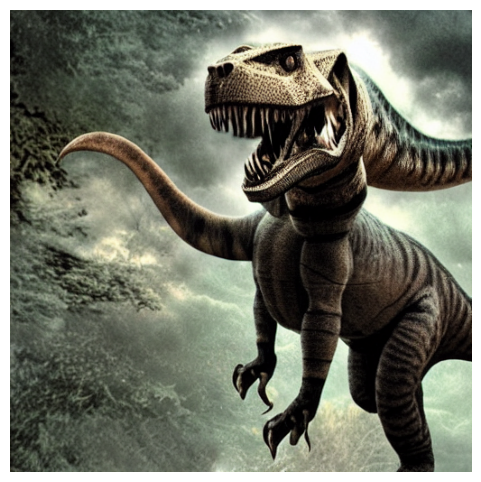

In [ ]:
# TODO: be creative!
# delete the DDPM model to free GPU memory
# del model
gc.collect()
torch.cuda.empty_cache()

# general settings of Stable Diffusion
height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 25  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
generator = torch.Generator(device).manual_seed(7)  # Seed generator to create the initial latent noise
checkpoint_stable = "CompVis/stable-diffusion-v1-4"

# image encoder and decoder (VAE)
vae = AutoencoderKL.from_pretrained(checkpoint_stable, subfolder="vae", use_safetensors=True)

# CLIP tokenizer and text encoder
tokenizer = CLIPTokenizer.from_pretrained(checkpoint_stable, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(checkpoint_stable, subfolder="text_encoder", use_safetensors=True)

# denoising U-Net model
unet = UNet2DConditionModel.from_pretrained(checkpoint_stable, subfolder="unet", use_safetensors=True)

# scheduler
scheduler = UniPCMultistepScheduler.from_pretrained(checkpoint_stable, subfolder="scheduler")
scheduler.set_timesteps(num_inference_steps)

# move everything to the GPU
vae.to(device)
text_encoder.to(device)
unet.to(device)
print("Loaded all components!")

# desired text prompt
prompt = ["a photograph of a cat riding a T-Rex going to war"]
batch_size = len(prompt)

# tokenization
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

# encoding with CLIP
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(device))[0]

# final text embeddings including unconditional for classifier guidance
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])


# initial noise in latent space
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=generator,
    device=device,
)
latents = latents * scheduler.init_noise_sigma

# denoising in latent space
for t in tqdm(scheduler.timesteps):

    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)

    # scale model input at timestep t
    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform classifier free guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample


# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
with torch.no_grad():
    image = vae.decode(latents).sample

# convert to image and show result
image = convert_tensor_to_pil_img(image)
plt.figure(figsize=(6,6))
plt.imshow(image)
plt.axis("off")
plt.show()


<img src="assets/code_task_icon.png" style="height:30px;display:inline\"/> **<span style="color:red">Task 5</span>**. Repeat the previous task but this time with an empty prompt `prompt=[""]`. Run this $N=3$ times with different random seeds.

<img src="assets/write_task_icon.png" style="height:30px;display:inline\"/> What can you conclude about the importance of giving the user the ability to manipulate the image generation process with text? Discuss this issue in your report.

Loaded all components!


  0%|          | 0/25 [00:00<?, ?it/s]

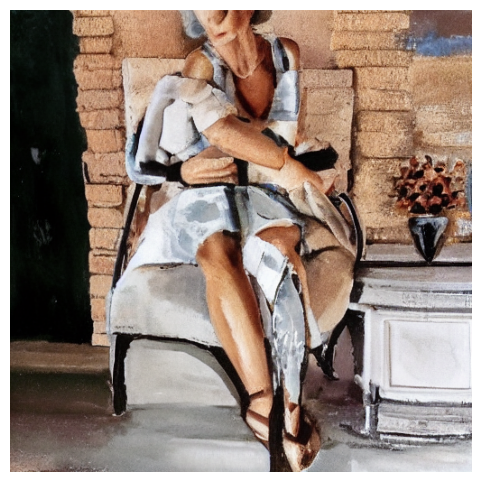

Loaded all components!


  0%|          | 0/25 [00:00<?, ?it/s]

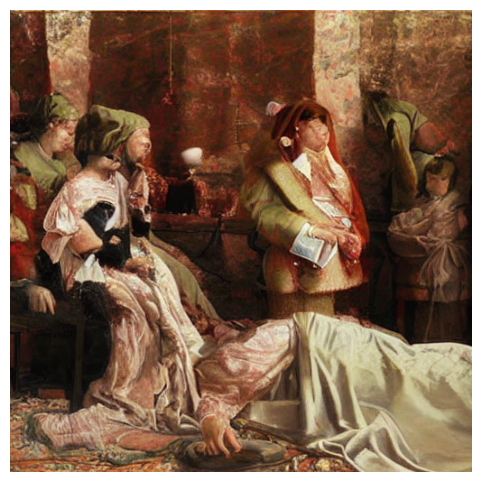

Loaded all components!


  0%|          | 0/25 [00:00<?, ?it/s]

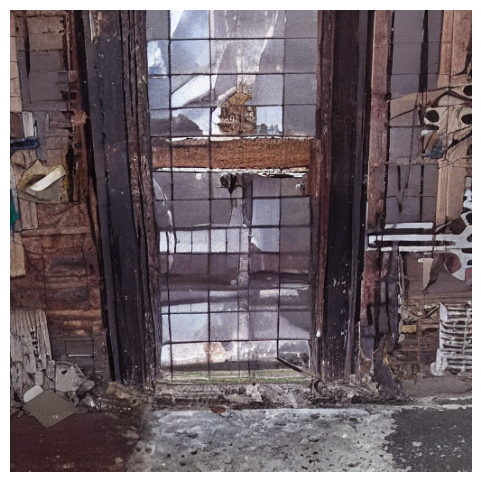

In [ ]:
for i in range(3):
    # TODO: repeat with empty prompt with different random seeds.
    # delete the DDPM model to free GPU memory
    # del model
    gc.collect()
    torch.cuda.empty_cache()

    # general settings of Stable Diffusion
    height = 512  # default height of Stable Diffusion
    width = 512  # default width of Stable Diffusion
    num_inference_steps = 25  # Number of denoising steps
    guidance_scale = 7.5  # Scale for classifier-free guidance
    generator = torch.Generator(device).manual_seed(i)  # Seed generator to create the initial latent noise
    checkpoint_stable = "CompVis/stable-diffusion-v1-4"

    # image encoder and decoder (VAE)
    vae = AutoencoderKL.from_pretrained(checkpoint_stable, subfolder="vae", use_safetensors=True)

    # CLIP tokenizer and text encoder
    tokenizer = CLIPTokenizer.from_pretrained(checkpoint_stable, subfolder="tokenizer")
    text_encoder = CLIPTextModel.from_pretrained(checkpoint_stable, subfolder="text_encoder", use_safetensors=True)

    # denoising U-Net model
    unet = UNet2DConditionModel.from_pretrained(checkpoint_stable, subfolder="unet", use_safetensors=True)

    # scheduler
    scheduler = UniPCMultistepScheduler.from_pretrained(checkpoint_stable, subfolder="scheduler")
    scheduler.set_timesteps(num_inference_steps)

    # move everything to the GPU
    vae.to(device)
    text_encoder.to(device)
    unet.to(device)
    print("Loaded all components!")

    # desired text prompt
    prompt = [""]
    batch_size = len(prompt)

    # tokenization
    text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

    # encoding with CLIP
    with torch.no_grad():
        text_embeddings = text_encoder(text_input.input_ids.to(device))[0]

    # final text embeddings including unconditional for classifier guidance
    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])


    # initial noise in latent space
    latents = torch.randn(
        (batch_size, unet.config.in_channels, height // 8, width // 8),
        generator=generator,
        device=device,
    )
    latents = latents * scheduler.init_noise_sigma

    # denoising in latent space
    for t in tqdm(scheduler.timesteps):

        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)

        # scale model input at timestep t
        latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform classifier free guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample


    # scale and decode the image latents with vae
    latents = 1 / 0.18215 * latents
    with torch.no_grad():
        image = vae.decode(latents).sample

    # convert to image and show result
    image = convert_tensor_to_pil_img(image)
    plt.figure(figsize=(6,6))
    plt.imshow(image)
    plt.axis("off")
    plt.show()


### Conclusion

To conclude, in this part we have seen the application of denoising diffusion models to image generation, image inpainting, and also experimented with an open source Text-to-image model. For those of you interested in playing with such models, a lot of great resources are publicly available online, as mentioned earlier in part I. This is it! I hope you had a great experience and gained new knowledge in this lab. Best of luck in your future endeavors.

### References

[1] Kingma, D., et al., "Auto-Encoding Variational Bayes", ICML (2014) [Link](https://arxiv.org/abs/1312.6114)

[2] Ho, J., et al., "Denoising Diffusion Probabilistic Models", NeuroIPS (2020) [Link](https://proceedings.neurips.cc/paper_files/paper/2020/file/4c5bcfec8584af0d967f1ab10179ca4b-Paper.pdf)

[3] Randford, A., et al. "Learning Transferable Visual Models From Natural Language Supervision", ICML (2021) [Link](https://arxiv.org/pdf/2103.00020.pdf)

[4] Rombach, R., et al. "High-Resolution Image Synthesis with Latent Diffusion Models", CVPR (2022). [Link](https://arxiv.org/abs/2112.10752)